In [1]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
import os
import time
import pandas as pd

In [2]:
kernel = np.ones((3, 3), np.uint8)

window_size = 3
min_disp = 2
num_disp = 130 - min_disp
stereo = cv2.StereoSGBM_create(minDisparity=min_disp,
                               numDisparities=num_disp,
                               blockSize=window_size,
                               uniquenessRatio=10,
                               speckleWindowSize=100,
                               speckleRange=32,
                               disp12MaxDiff=5,
                               P1=8 * 3 * window_size ** 2,
                               P2=32 * 3 * window_size ** 2)

#stereo = cv2.StereoBM_create(numDisparities=16, blockSize=15)

In [3]:
yoloFiles = '/home/aman/Documents/Project/DepthCal/Code/Tiny Yolo Files/'

net = cv2.dnn.readNet(yoloFiles + 'yolov3-tiny.weights',yoloFiles + 'yolov3-tiny.cfg')
classes = []
with open(yoloFiles + 'coco.names','r') as f:
    classes = [line.strip() for line in f.readlines()]

layer_names = net.getLayerNames()
output_layers = [layer_names[i[0]-1] for i in net.getUnconnectedOutLayers()]
colors = np.random.uniform(0,255,size = (len(classes),3))

In [4]:
path = "/home/aman/Documents/Project/DepthCal/Data/mobileData/"

In [5]:
f = []
for (root,dirs,files) in os.walk(path, topdown=True):
    f.append(files)
    
files.sort()

In [6]:
files

['1.jpg',
 '1_1.jpg',
 '2.jpg',
 '2_1.jpg',
 '3.jpg',
 '3_1.jpg',
 '4.jpg',
 '4_1.jpg',
 '5.jpg',
 '5_1.jpg',
 '6.jpg',
 '6_1.jpg',
 '7.jpg',
 '7_1.jpg',
 'IMG20200205163420.jpg',
 'IMG20200205163426.jpg',
 'IMG20200205163543.jpg',
 'IMG20200205163549.jpg',
 'IMG20200205163646.jpg',
 'IMG20200205163651.jpg',
 'IMG20200205163827.jpg',
 'IMG20200205163831.jpg',
 'IMG20200205163912.jpg',
 'IMG20200205163916.jpg',
 'IMG20200205164004.jpg',
 'IMG20200205164008.jpg',
 'IMG20200205164039.jpg',
 'IMG20200205164043.jpg',
 'IMG20200205164144.jpg',
 'IMG20200205164149.jpg',
 'IMG20200205164245.jpg',
 'IMG20200205164249.jpg',
 'IMG20200205164339.jpg',
 'IMG20200205164345.jpg',
 'IMG20200205164434.jpg',
 'IMG20200205164446.jpg',
 'IMG20200205164535.jpg',
 'IMG20200205164540.jpg',
 'IMG20200205164627.jpg',
 'IMG20200205164632.jpg',
 'IMG20200205164705.jpg',
 'IMG20200205164710.jpg',
 'IMG20200205164801.jpg',
 'IMG20200205164806.jpg',
 'IMG20200205165005.jpg',
 'IMG20200205165010.jpg',
 'IMG202002051

In [7]:
def disp(frameL, frameR):
    grayR = cv2.cvtColor(frameR, cv2.COLOR_BGR2GRAY)
    grayL = cv2.cvtColor(frameL, cv2.COLOR_BGR2GRAY)
    
    disp = stereo.compute(grayL, grayR)
    disp = ((disp.astype(np.float32) / 16) - min_disp) / num_disp
    
    return disp

In [8]:
def objectDetection(img):
    li = []
    w = 0
    height,width,channels = img.shape
    blob = cv2.dnn.blobFromImage(img,.00392,(416,416), (0,0,0),True, crop=False)
    net.setInput(blob)
    outs = net.forward(output_layers)

    class_ids = []
    confidences = []

    for out in outs:
        for detection in out:
            scores = detection[5:]
            class_id = np.argmax(scores)
            confidence = scores[class_id]
            if confidence>.5:
                center_x = int(detection[0] * width)
                center_y = int(detection[1] * height)

                w = int(detection[2] * width)
                h = int(detection[3] * height)

                x0 = int(center_x - (w / 2))
                x1 = x0 + w

                y0 = int(center_y - (h / 2))
                y1 = y0 + h
                confidences.append(float(confidence))
                class_ids.append(class_id)
                
                if x0 < 0:
                    x0 = 0
                if x1 > width:
                    x1 = width
                if y0 < 0:
                    y0 = 0
                if y1 > height:
                    y1 = height
    if w>0:
        li = [x0, y0, x1, y1]
        
    return li

In [9]:
def depth(i):
    imgL = plt.imread(path + files[2*i])
    imgL = cv2.resize(imgL, (480, 720))
    liL = objectDetection(imgL)
    
    if len(liL)>0:
        imgR = plt.imread(path + files[2*i+1])
        imgR = cv2.resize(imgR, (480, 720))
        dis = disp(imgL, imgR)
            
        ct = 0
        d = 0
        for j in range(liL[1], liL[3]):
            for i in range(liL[0], liL[2]):
                if(dis[j, i] != 0):
                    d = d+dis[j, i]
                    ct = ct+1          
        
        if d > 0:
            d = d/ct
            disparity.append(d)
                
            cv2.rectangle(imgL, (liL[0], liL[1]), (liL[2], liL[3]), (255, 255, 255), 5)
                
            fig, (lView, rView, Disp) = plt.subplots(ncols=3, figsize=(16, 8))
            lView.imshow(imgL, 'gray')
            rView.imshow(imgR, 'gray')
            Disp.imshow(dis, 'gray')
            plt.show()
            
        else:
            disparity.append(0)
            
    else:
        disparity.append(0)

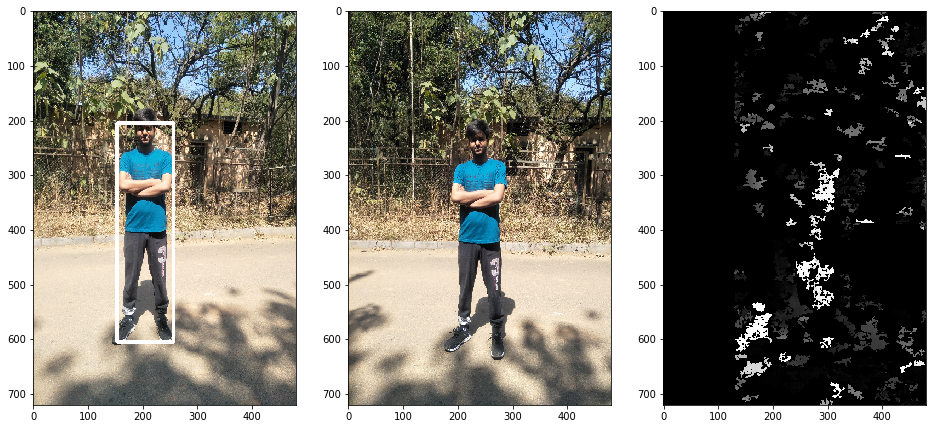

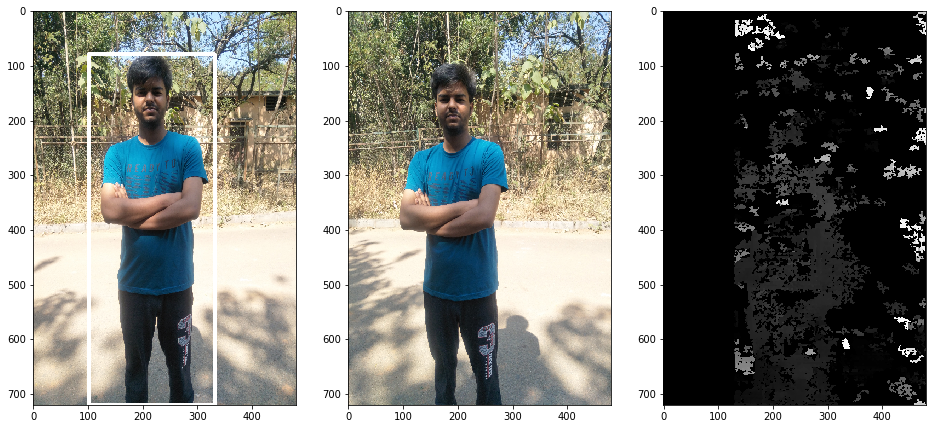

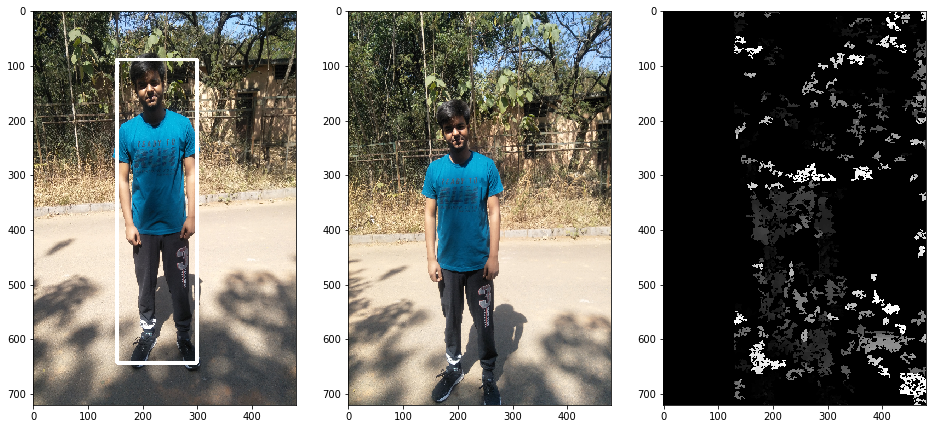

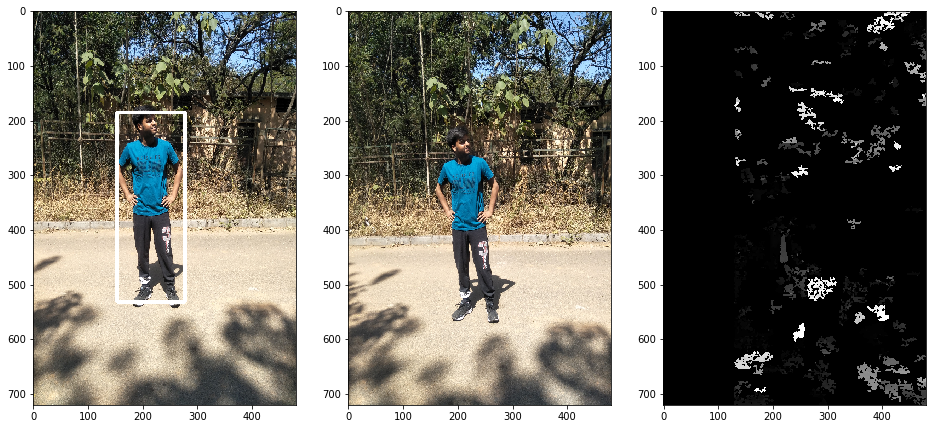

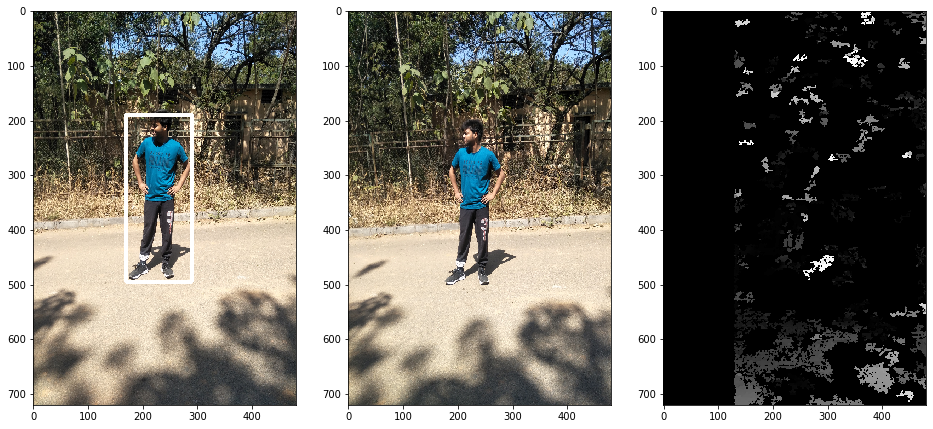

...

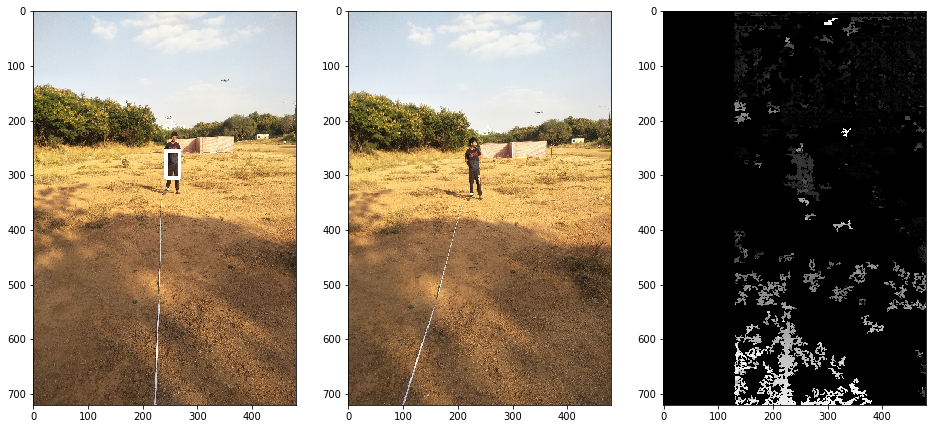

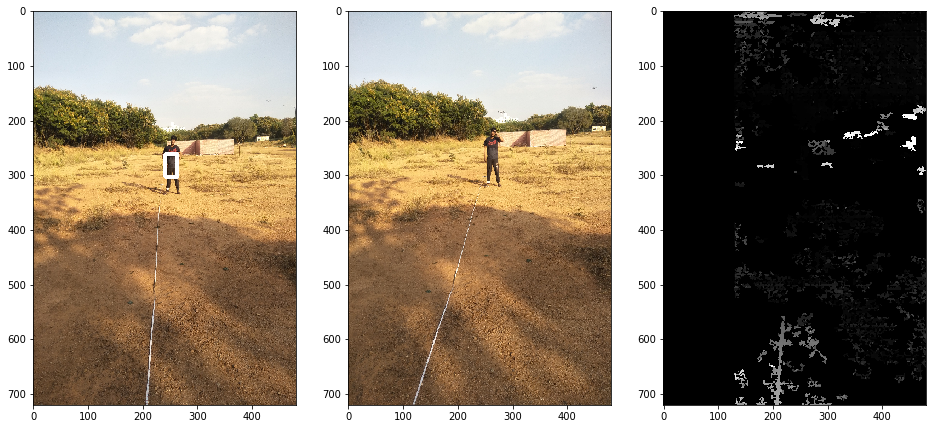

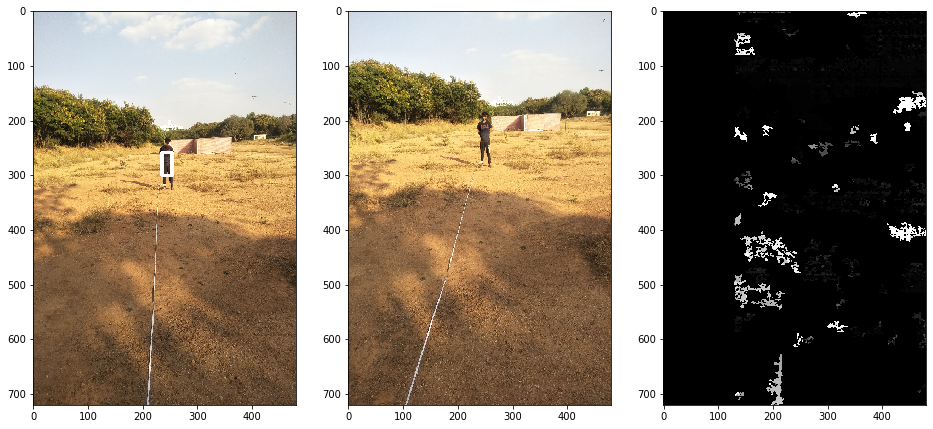

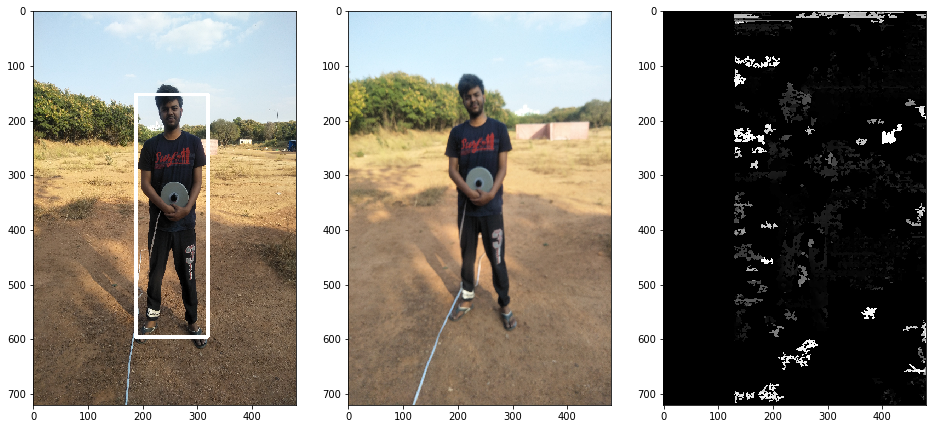

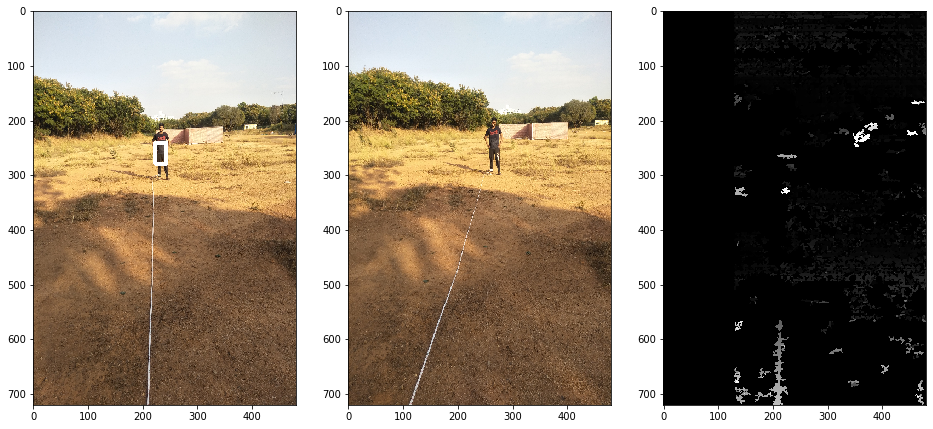

In [10]:
disparity = []

l = int(len(files)/2)
a = time.time()
for i in range(l):
    depth(i)
b = time.time()

In [17]:
seconds = b-a
seconds

42.180848598480225

In [18]:
fps = len(files)/seconds
fps

1.1379571913526993

In [19]:
aD = pd.read_csv("/home/aman/Documents/Project/DepthCal/Data/Distance/distance.csv", header = None)
actualDistance = aD[0]
actualDistance

0      2.0
1      1.0
2      1.5
3      2.5
4      3.0
5      5.0
6      4.0
7      6.0
8      6.5
9      5.5
10     5.0
11     4.5
12     4.0
13     3.0
14     7.0
15     7.5
16     8.0
17     8.5
18     9.0
19     9.5
20    10.0
21     2.0
22    10.0
23     9.5
Name: 0, dtype: float64

In [20]:
disparity

[0.07207374404489023,
 0.06568842385891586,
 0.07721033850612581,
 0.032580389321942356,
 0.034352560063530886,
 0.08237763110909511,
 0.05153363576564911,
 0.006690955528846154,
 0.04262438892612796,
 0.010849738436123349,
 0.040944248338870434,
 0.043693664298122416,
 0.07582964215959821,
 0.021290843205057596,
 0.07601336578824627,
 0.051044921875,
 0.003704676075646794,
 0.13887396364795918,
 0.0020576171875,
 0,
 0.03339351955935252,
 0.032386341475502525,
 0,
 0.06967815170940171]

In [21]:
len(aD)

24

In [22]:
len(disparity)

24

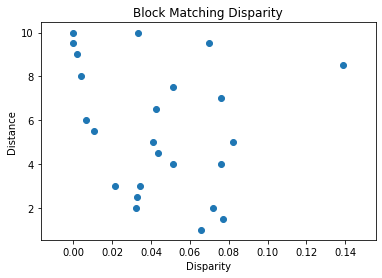

In [27]:
plt.scatter(disparity, actualDistance)
plt.title("Block Matching Disparity")
plt.xlabel("Disparity")
plt.ylabel("Distance")
plt.savefig("tatti", dpi = 500)
plt.show()

In [18]:
for i in range(l):
    print("Frame " + str(i) + " : " + str(disparity[i]) + " : " + str(actualDistance[i]))

Frame 0 : 0.07207374404489023 : 2.0
Frame 1 : 0.06568842385891586 : 1.0
Frame 2 : 0.07721033850612581 : 1.5
Frame 3 : 0.032580389321942356 : 2.5
Frame 4 : 0.034352560063530886 : 3.0
Frame 5 : 0.08237763110909511 : 5.0
Frame 6 : 0.05153363576564911 : 4.0
Frame 7 : 0.006690955528846154 : 6.0
Frame 8 : 0.04262438892612796 : 6.5
Frame 9 : 0.010849738436123349 : 5.5
Frame 10 : 0.040944248338870434 : 5.0
Frame 11 : 0.043693664298122416 : 4.5
Frame 12 : 0.07582964215959821 : 4.0
Frame 13 : 0.021290843205057596 : 3.0
Frame 14 : 0.07601336578824627 : 7.0
Frame 15 : 0.051044921875 : 7.5
Frame 16 : 0.003704676075646794 : 8.0
Frame 17 : 0.13887396364795918 : 8.5
Frame 18 : 0.0020576171875 : 9.0
Frame 19 : 0 : 9.5
Frame 20 : 0.03339351955935252 : 10.0
Frame 21 : 0.032386341475502525 : 2.0
Frame 22 : 0 : 10.0
Frame 23 : 0.06967815170940171 : 9.5
